
# Lung Disease Diagnosis - Exploratory Data Analysis

Developer: Tung Nguyen

This notebook contains some preliminary data exploration of [this dataset](https://www.kaggle.com/datasets/nih-chest-xrays/data).

It is a collection of ~112,000 labeled chest x-ray images from ~30,000 unique patients, along with a limited set of bounding boxes. There are a few unique details about this dataset:

* The labels were obtained via natural language processing of the associated radiological reports, and thus, are not 100% accurate (the owners of the dataset predict accuracy to be >90%).

* This is a multi-label problem, meaning there could be multiple diseases diagnosed for a single image. There is also the possibility of the labels being *partially* correct, e.g. 1 of the 3 labels obtained for a given image via NLP is not accurate.

* The negative label, 'No Finding', does not mean no disease, but rather, that the 14 diseases studied were not present. 

<br>
The end-goal of this project is to train a deep learning model to automatically classify the disease given the image.

## Tabular Data Exploration
---

The dataset also comes with some tabular data that provides a bit more detail about the x-ray, such as:

- Follow-Up #: Denotes the medical exam number where the x-ray was taken.
- Patient ID
- Patient Age
- Patient Gender
- View Position: Denotes whether the x-ray was taken from the front or back of the patient.
- Original Image Width, Height, and Spacing: The images uploaded to the dataset are resized to reduce file size.
- Unnamed: 11 - No details provided as to why this column of mainly NA's exist.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as img
from sklearn.preprocessing import MultiLabelBinarizer

In [3]:
df = pd.read_csv('../chest-x-ray-data/Data_Entry_2017.csv')

with open('../chest-x-ray-data/train_val_list.txt', 'r') as f:
    train_list = f.read().split('\n')

with open('../chest-x-ray-data/test_list.txt', 'r') as f:
    test_list = f.read().split('\n')

display(df.head(5))

print()
n_train = len(train_list)
n_test = len(test_list)
print('Training Set Size: %i (%.1f%%)' % (n_train, 100*n_train/(n_train + n_test)))
print('Test Set Size: %i (%.1f%%)' %  (n_test, 100*n_test/(n_train + n_test)))

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11
0,00000001_000.png,Cardiomegaly,0,1,58,M,PA,2682,2749,0.143,0.143,NaN
1,00000001_001.png,Cardiomegaly|Emphysema,1,1,58,M,PA,2894,2729,0.143,0.143,NaN
2,00000001_002.png,Cardiomegaly|Effusion,2,1,58,M,PA,2500,2048,0.168,0.168,NaN
3,00000002_000.png,No Finding,0,2,81,M,PA,2500,2048,0.171,0.171,NaN
4,00000003_000.png,Hernia,0,3,81,F,PA,2582,2991,0.143,0.143,NaN



Training Set Size: 86524 (77.2%)
Test Set Size: 25596 (22.8%)


In [4]:
df.dtypes

Image Index                     object
Finding Labels                  object
Follow-up #                      int64
Patient ID                       int64
Patient Age                      int64
Patient Gender                  object
View Position                   object
OriginalImage[Width              int64
Height]                          int64
OriginalImagePixelSpacing[x    float64
y]                             float64
Unnamed: 11                    float64
dtype: object

In [5]:
df.isnull().sum()

Image Index                         0
Finding Labels                      0
Follow-up #                         0
Patient ID                          0
Patient Age                         0
Patient Gender                      0
View Position                       0
OriginalImage[Width                 0
Height]                             0
OriginalImagePixelSpacing[x         0
y]                                  0
Unnamed: 11                    112120
dtype: int64

In [6]:
# Drop unnecessary columns
df = df.drop(['OriginalImage[Width', 'Height]', 'OriginalImagePixelSpacing[x','y]', 'Unnamed: 11'], axis=1, inplace=False)

In [7]:
df['Finding Labels'].value_counts(ascending=False)[:10]

No Finding                  60361
Infiltration                 9547
Atelectasis                  4215
Effusion                     3955
Nodule                       2705
Pneumothorax                 2194
Mass                         2139
Effusion|Infiltration        1603
Atelectasis|Infiltration     1350
Consolidation                1310
Name: Finding Labels, dtype: int64

In [8]:
df[df['Finding Labels'].str.split('|').apply(lambda x: len(x)) > 2]['Finding Labels'].value_counts(ascending=False)[:10]

Atelectasis|Effusion|Infiltration         737
Atelectasis|Consolidation|Effusion        200
Edema|Infiltration|Pneumonia              137
Consolidation|Effusion|Infiltration       134
Edema|Effusion|Infiltration               127
Cardiomegaly|Effusion|Infiltration        120
Effusion|Infiltration|Nodule              106
Atelectasis|Consolidation|Infiltration    104
Effusion|Infiltration|Mass                 99
Atelectasis|Effusion|Pneumothorax          99
Name: Finding Labels, dtype: int64

__Observations__

* There is a class imbalance problem - a lot of the chest x-ray images provided are 'No Finding' (e.g. the negative label).

* Atelectasis, Effusion, and Infiltration are the most common complications, and also tend to occur in the same patient often (one complication may be more likely to cause another).

In [9]:
display(df['View Position'].value_counts())
display(df['Patient Gender'].value_counts())
print('Number of unique patients: %i' % len(df['Patient ID'].unique()))

PA    67310
AP    44810
Name: View Position, dtype: int64

M    63340
F    48780
Name: Patient Gender, dtype: int64

Number of unique patients: 30805


__Observations__
* PA is the opposite of AP, but the lung complication can be on either left or right. Thus, flipping the images to be all in the same orientation should not be needed (e.g. the model should be robust enough to handle this noise).

* There is not a class imbalance between male or female patients. A choice will have to be made later on whether or not to build separate model for male & female to account for differences in anatomy, or build one model for both & deal with the noise this may cause.

In [10]:
df[['Follow-up #', 'Patient Age']].describe()

,Follow-up #,Patient Age
count,112120.000000,112120.000000
mean,8.573751,46.901463
std,15.406320,16.839923
min,0.000000,1.000000
25%,0.000000,35.000000
50%,3.000000,49.000000
75%,10.000000,59.000000
max,183.000000,414.000000


__Observations__
* It looks like there are some mistakes in the age, as a patient cannot be 414 years old. This mistake won't matter as the tabular data will not be an input into the model. As many patients come in for multiple chest x-rays in this particular dataset, one method of remedying this mistake is to replace the outliers with the mean of the same patient.

* Most patients come back, on average, about 8 times. One patient has gone back 183 times (this may be a mistake similar to the age mistake above).

In [11]:
# Binarize the labels for classification & ease of plotting
mlb = MultiLabelBinarizer()
lbl_bins = mlb.fit_transform(df['Finding Labels'].str.split("|"))
lbl_bins

array([[0, 1, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [12]:
df_bin = df.join(pd.DataFrame(lbl_bins, columns=mlb.classes_))
df_bin.head()

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,Atelectasis,Cardiomegaly,Consolidation,...,Emphysema,Fibrosis,Hernia,Infiltration,Mass,No Finding,Nodule,Pleural_Thickening,Pneumonia,Pneumothorax
0,00000001_000.png,Cardiomegaly,0,1,58,M,PA,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,00000001_001.png,Cardiomegaly|Emphysema,1,1,58,M,PA,0,1,0,...,1,0,0,0,0,0,0,0,0,0
2,00000001_002.png,Cardiomegaly|Effusion,2,1,58,M,PA,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,00000002_000.png,No Finding,0,2,81,M,PA,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,00000003_000.png,Hernia,0,3,81,F,PA,0,0,0,...,0,0,1,0,0,0,0,0,0,0


## Tabular Data Visualization
---

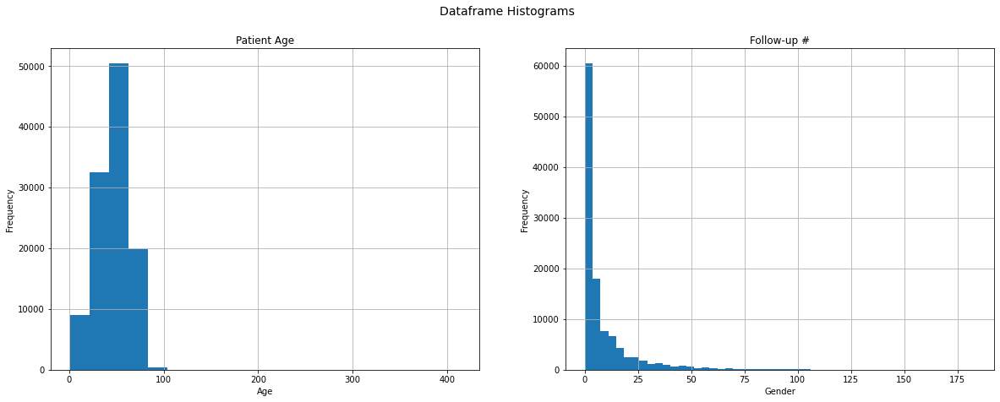

In [40]:
fig, axes = plt.subplots(1, 2, figsize=[20, 7])

fig.subplots_adjust(hspace=0.3)
fig.suptitle('Dataframe Histograms', fontsize=14)

df['Patient Age'].hist(ax=axes[0], bins=20)
axes[0].title.set_text('Patient Age');
axes[0].set_xlabel('Age');
axes[0].set_ylabel('Frequency');

df['Follow-up #'].hist(ax=axes[1], bins=50)
axes[1].title.set_text('Follow-up #');
axes[1].set_xlabel('Gender');
axes[1].set_ylabel('Frequency');

__Observations__
* The plots above clearly show outliers (mistakes), which if this data is to be used as input, will need to be fixed.

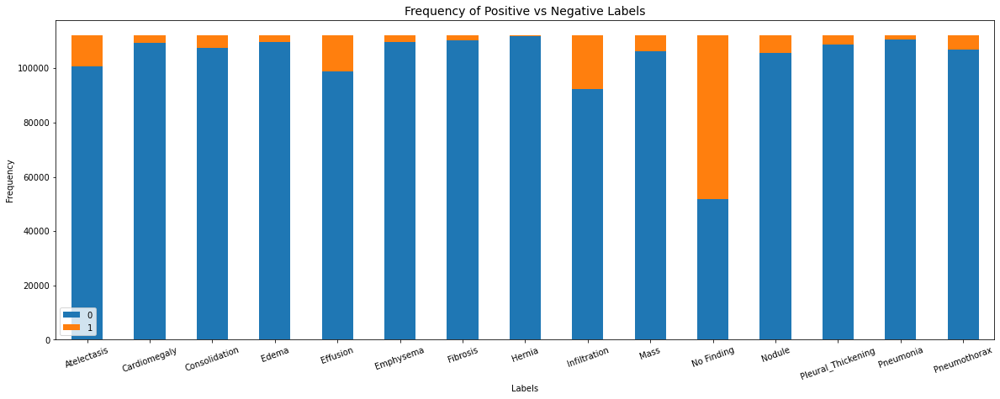

In [14]:
fig = df_bin[mlb.classes_.tolist()].apply(pd.Series.value_counts).transpose().plot.bar(stacked=True, figsize=(20, 7), rot=20)
fig.legend(loc='lower left')
fig.set_title('Frequency of Positive vs Negative Labels', fontsize=14);
fig.set_xlabel('Labels');
fig.set_ylabel('Frequency');

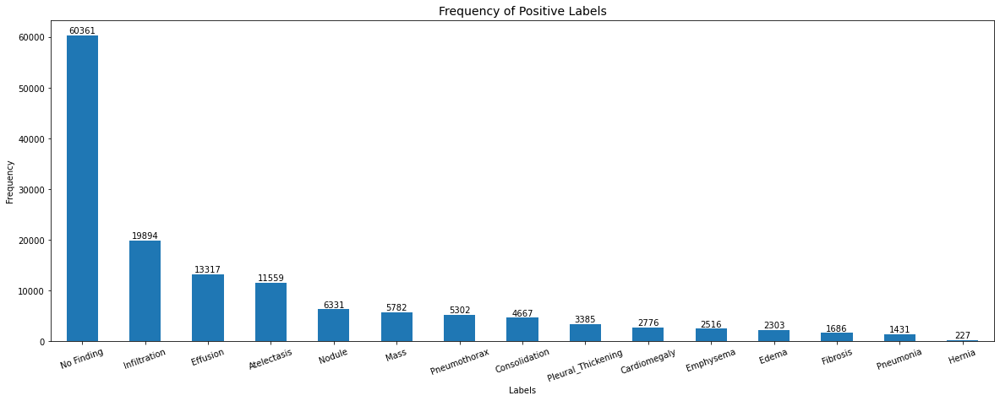

In [15]:
fig = df_bin[mlb.classes_.tolist()].sum().sort_values(ascending=False).plot(kind='bar', figsize=(20, 7), rot=20);
fig.set_title('Frequency of Positive Labels', fontsize=14);
fig.set_xlabel('Labels');
fig.set_ylabel('Frequency');
fig.bar_label(fig.containers[0]);

__Observations__
* The plots above show the class imbalance problem much more clearly - there are not alot of positive labels relative to negative ones.

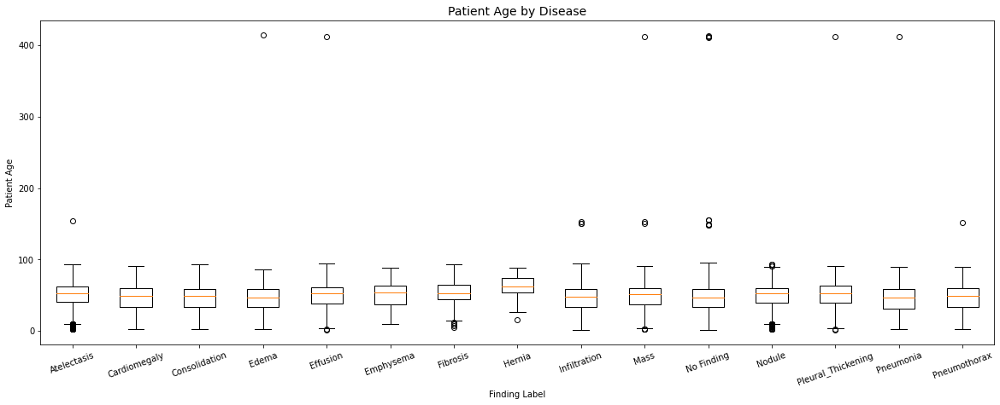

In [16]:
data = []
M = []
F = []
for label in mlb.classes_:
    data.append(df_bin[df_bin[label] == 1]['Patient Age'])
    M.append(df_bin[df_bin[label] == 1]['Patient Gender'].value_counts()[0])
    F.append(df_bin[df_bin[label] == 1]['Patient Gender'].value_counts()[1])

fig, ax = plt.subplots(figsize=(20, 7))
ax.boxplot(data);
ax.set_xticklabels(mlb.classes_, rotation=20);
ax.set_title('Patient Age by Disease', fontsize=14);
ax.set_xlabel('Finding Label');
ax.set_ylabel('Patient Age');

__Observations__
* The plot above identifies the specific outlier data points.

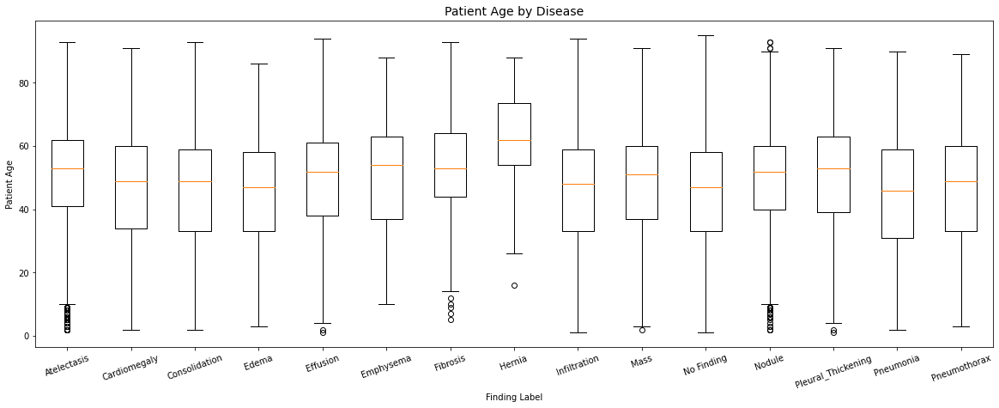

In [41]:
# Quick & dirty method to delete outliers
df_temp = df_bin[df_bin['Patient Age'] < 100]

# Replot
data = []
M = []
F = []
for label in mlb.classes_:
    data.append(df_temp[df_temp[label] == 1]['Patient Age'])
    M.append(df_temp[df_temp[label] == 1]['Patient Gender'].value_counts()[0])
    F.append(df_temp[df_temp[label] == 1]['Patient Gender'].value_counts()[1])

fig, ax = plt.subplots(figsize=(20, 7))
ax.boxplot(data);
ax.set_xticklabels(mlb.classes_, rotation=20);
ax.set_title('Patient Age by Disease', fontsize=14);
ax.set_xlabel('Finding Label');
ax.set_ylabel('Patient Age');

__Observations__
* Hernia appears to primarily affect the older population (55 - 70 years old). The majority of patients for all the other 13 diseases appear to be around 40 - 60 years old.

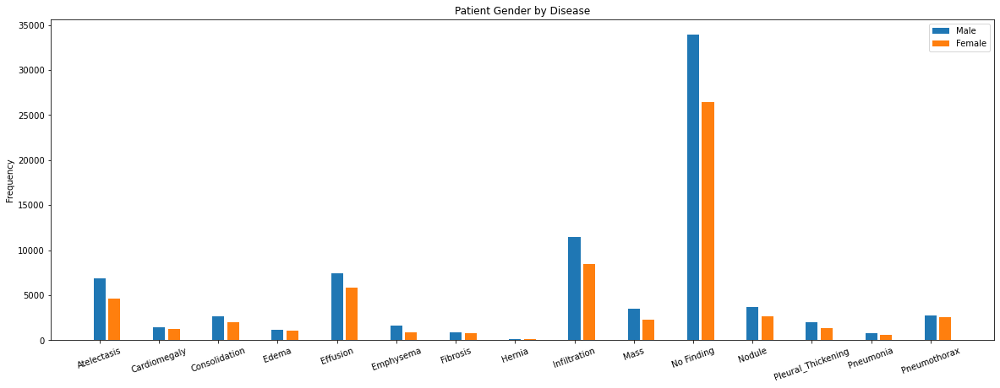

In [17]:
ind = np.arange(15)

fig, ax = plt.subplots(figsize=(20, 7))
ax.bar(x=ind, height=M, width=0.2, label='Male')
ax.bar(x=ind+0.25, height=F, width=0.2, label='Female')
ax.legend();
ax.set_xticks(ind, mlb.classes_, rotation=20);
ax.set_ylabel('Frequency');
ax.set_title('Patient Gender by Disease');

__Observations__
* All lung diseases in this study do not seem to affect one gender above the other.

In [18]:
# Split into train/val & test
df_train = df_bin[df_bin['Image Index'].isin(train_list)]
df_test = df_bin[df_bin['Image Index'].isin(test_list)]

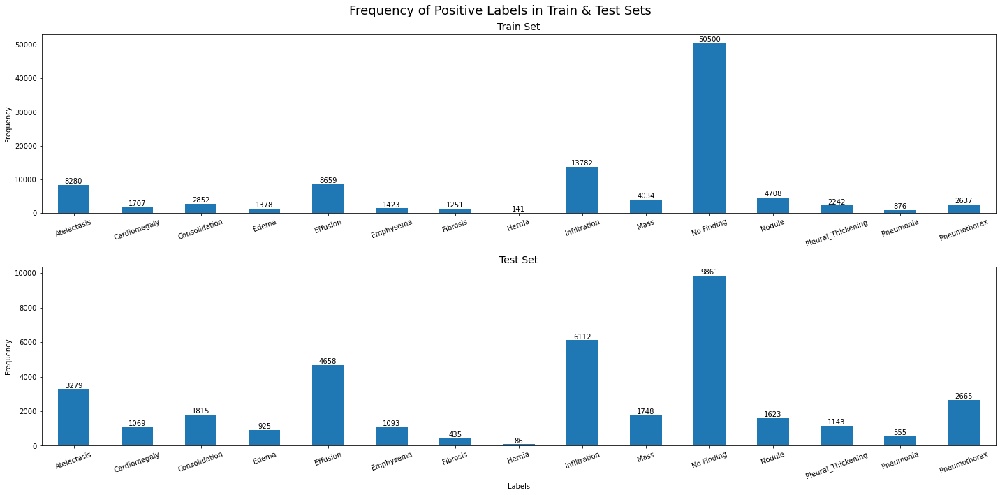

In [29]:
fig, ax = plt.subplots(2, 1, figsize=[20, 10])

plt.suptitle('Frequency of Positive Labels in Train & Test Sets', fontsize=18)

df_train[mlb.classes_.tolist()].sum().plot(ax=ax[0], kind='bar', rot=20);
ax[0].set_title('Train Set', fontsize=14);
ax[0].set_ylabel('Frequency');
ax[0].bar_label(ax[0].containers[0]);

df_test[mlb.classes_.tolist()].sum().plot(ax=ax[1], kind='bar', rot=20);
ax[1].set_title('Test Set', fontsize=14);
ax[1].set_xlabel('Labels');
ax[1].set_ylabel('Frequency');
ax[1].bar_label(ax[1].containers[0]);

plt.tight_layout()

__Observations__
* Distribution of Train/Test sets are roughly equal.

## Image Exploration
---

In [20]:
imgs_dir = '../chest-x-ray-data/imgs/'

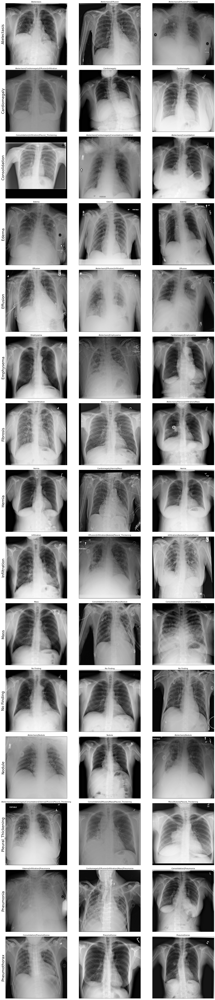

In [39]:
# Plot some sample images of Chest X-Rays from df_train
with plt.style.context('default'):
    fig, ax = plt.subplots(15, 3, figsize=(20, 90))
    fig.tight_layout()
    for c in np.arange(0, 3):
        for r, lbl in enumerate(mlb.classes_.tolist()):
            img_path, true_label = df_train[df_train[lbl] == 1].sample(1, random_state=1 + c)[['Image Index', 'Finding Labels']].T.values
            ex = img.imread(imgs_dir + img_path[0])
            ax[r, c].imshow(ex, cmap='gray')
            ax[r, c].set_title(true_label[0])
            if c == 0:
                ax[r, c].set_ylabel(lbl, fontsize=24)
            ax[r, c].get_xaxis().set_ticks([])
            ax[r, c].get_yaxis().set_ticks([])

__Observations__
* As expected, images vary greatly in quality. There are also text labels in the picture itself.